In [1]:
!pip install kaggle

# Upload your kaggle.json file (API key)
from google.colab import files
files.upload()

!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

# Replace with the actual dataset name
!kaggle datasets download -d 'rashikrahmanpritom/plant-disease-recognition-dataset'

# Unzip the downloaded dataset
!unzip plant-disease-recognition-dataset.zip

Saving kaggle.json to kaggle.json
Dataset URL: https://www.kaggle.com/datasets/rashikrahmanpritom/plant-disease-recognition-dataset
License(s): CC0-1.0
Archive:  plant-disease-recognition-dataset.zip
  inflating: Test/Test/Healthy/8ddaa5a5caa5caa8.jpg  
  inflating: Test/Test/Healthy/8ddaac1bd6c8cd0a.jpg  
  inflating: Test/Test/Healthy/8ddd5ec1c0de38c4.jpg  
  inflating: Test/Test/Healthy/8def3f60308ab41b.jpg  
  inflating: Test/Test/Healthy/8def4d91382175c3.jpg  
  inflating: Test/Test/Healthy/8df452e2e38c0b6e.jpg  
  inflating: Test/Test/Healthy/8dfae9d78cc32089.jpg  
  inflating: Test/Test/Healthy/8e3dbccdfe08c850.jpg  
  inflating: Test/Test/Healthy/8e68163c62dc57d5.jpg  
  inflating: Test/Test/Healthy/8e6a823cce9ff40c.jpg  
  inflating: Test/Test/Healthy/8e77857194a59a87.jpg  
  inflating: Test/Test/Healthy/8e79802b3fb770c8.jpg  
  inflating: Test/Test/Healthy/8e7986d1ecd36445.jpg  
  inflating: Test/Test/Healthy/8e7e70a6878c1c79.jpg  
  inflating: Test/Test/Healthy/8e82b1a51bd11

In [2]:
import tensorflow as tf

path = "/content/Train/Train"
train = tf.keras.preprocessing.image_dataset_from_directory(path, batch_size=32,
                                    image_size=(256,256),shuffle=True)

Found 1322 files belonging to 3 classes.


In [3]:
path = "/content/Test/Test"
test = tf.keras.preprocessing.image_dataset_from_directory(path, batch_size=32,
                                    image_size=(256,256),shuffle=True)

Found 150 files belonging to 3 classes.


In [4]:
path = "/content/Validation/Validation"
valid = tf.keras.preprocessing.image_dataset_from_directory(path, batch_size=32,
                                    image_size=(256,256),shuffle=True)

Found 60 files belonging to 3 classes.


In [5]:
class_labels = train.class_names
class_labels

['Healthy', 'Powdery', 'Rust']

# Train Data Image

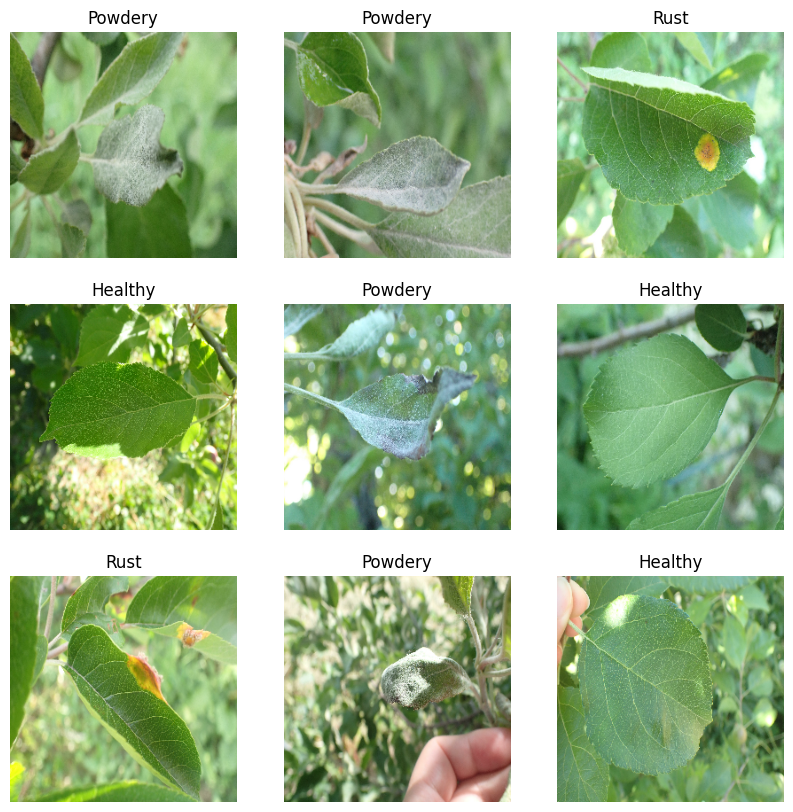

In [6]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10,10))
for image_batch , image_label in train.take(3):
    for i in range(9):
        plt.subplot(3,3,i+1)
        plt.imshow(image_batch[i].numpy().astype("uint8"))
        plt.title(class_labels[image_label[i].numpy()])
        plt.axis("off")

# Gaussian Noise

In [7]:
def add_gaussian_noise(images, mean, stddev):
    noise = tf.random.normal(shape=tf.shape(images), mean=mean, stddev=stddev, dtype=tf.float32)
    noisy_images = images + noise
    return tf.clip_by_value(noisy_images, 0.0, 1.0)

# Data Augmentation

In [8]:
data_augmentation = tf.keras.Sequential([
    tf.keras.layers.Resizing(256, 256),
    tf.keras.layers.Rescaling(1.0/255),
    tf.keras.layers.RandomContrast(0.3),
    tf.keras.layers.RandomFlip('horizontal_and_vertical'),
    tf.keras.layers.RandomZoom(0.3),
    tf.keras.layers.RandomRotation(0.2),
    tf.keras.layers.Lambda(lambda x: add_gaussian_noise(x, mean=0.0, stddev=0.05))
])

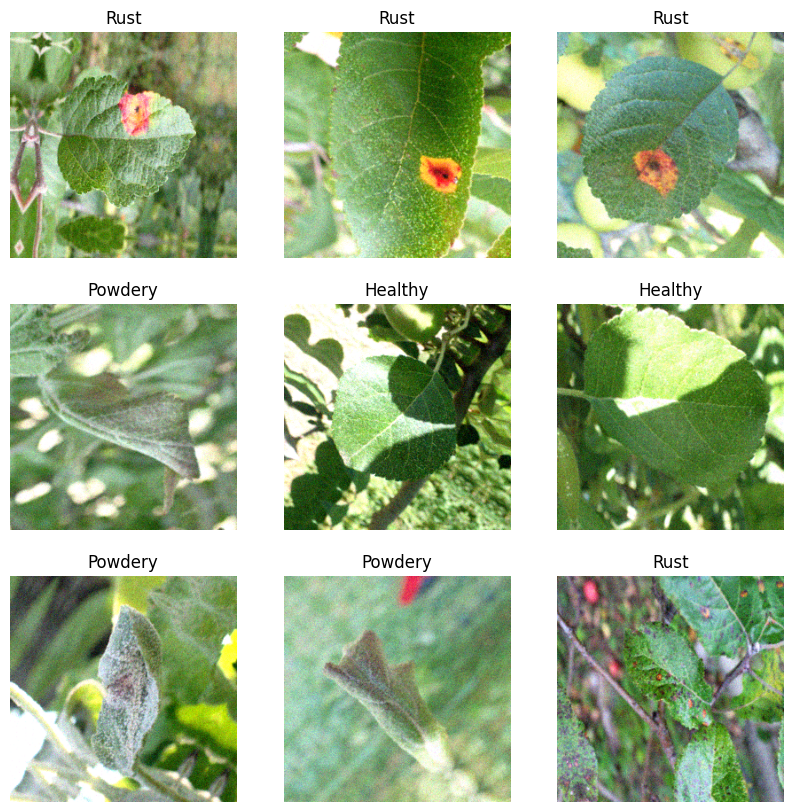

In [9]:
plt.figure(figsize=(10, 10))
for image_batch, image_label in train.take(1):
    augmented_images = data_augmentation(image_batch)
    for i in range(9):
        plt.subplot(3, 3, i + 1)
        img_to_display = (augmented_images[i].numpy() * 255).astype("uint8")
        plt.imshow(img_to_display)
        plt.title(class_labels[image_label[i].numpy()])
        plt.axis("off")
plt.show()

# CNN MODEL

In [10]:
IMAGE_SIZE=256
CHANNELS=3
BATCH_SIZE=32
EPOCHS=30

input_shape=(BATCH_SIZE , IMAGE_SIZE, IMAGE_SIZE, CHANNELS)

model= tf.keras.models.Sequential([
  data_augmentation,
  # Convolution layer 1
  tf.keras.layers.Conv2D(filters=64, kernel_size=(3,3), strides=(1,1),padding='valid',activation='relu',input_shape=input_shape),
  tf.keras.layers.MaxPool2D(pool_size=(2,2)),

  # Convolution layer 2
  tf.keras.layers.Conv2D(filters=64, kernel_size=(3,3),strides=(1,1),padding='valid',activation='relu'),
  tf.keras.layers.MaxPool2D(pool_size=(2,2)),

  # Convolution layer 3
  tf.keras.layers.Conv2D(filters=64, kernel_size=(3,3),strides=(1,1),padding='valid',activation='relu'),
  tf.keras.layers.MaxPool2D(pool_size=(2,2)),

  # Convolution layer 4
  tf.keras.layers.Conv2D(filters=64, kernel_size=(3,3),strides=(1,1),padding='valid',activation='relu'),
  tf.keras.layers.MaxPool2D(pool_size=(2,2)),

  # Flatten Layers
  tf.keras.layers.Flatten(),

  # Dense layers
  tf.keras.layers.Dense(units=500,activation='relu'),
  tf.keras.layers.Dropout(0.4),
  tf.keras.layers.Dense(units=500,activation='relu'),
  tf.keras.layers.Dropout(0.3),
  tf.keras.layers.Dense(units=100,activation='relu'),
  tf.keras.layers.Dropout(0.2),
  tf.keras.layers.Dense(units=3,activation='softmax')

])

model.build(input_shape=input_shape)

/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [11]:
model.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ sequential (Sequential)         │ (32, 256, 256, 3)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d (Conv2D)                 │ (32, 254, 254, 64)     │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (32, 127, 127, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (32, 125, 125, 64)     │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (32, 62, 62, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (32, 60, 60, 64)       │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (32, 30, 30, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (32, 28, 28, 64)       │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (32, 14, 14, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (32, 12544)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (32, 500)              │     6,272,500 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (32, 500)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (32, 500)              │       250,500 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (32, 500)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (32, 100)              │        50,100 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (32, 100)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (32, 3)                │           303 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 6,685,979 (25.50 MB)

 Trainable params: 6,685,979 (25.50 MB)

 Non-trainable params: 0 (0.00 B)

In [12]:
model.compile(optimizer="adam",
             loss="sparse_categorical_crossentropy",
             metrics=["accuracy"])

history = model.fit(train ,  batch_size=32 ,epochs=30,
                verbose=1,
                validation_data=valid) # epochs=30

Epoch 1/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 361s 8s/step - accuracy: 0.3514 - loss: 1.1538 - val_accuracy: 0.3667 - val_loss: 1.0677
Epoch 2/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 383s 8s/step - accuracy: 0.4409 - loss: 1.0177 - val_accuracy: 0.5667 - val_loss: 0.8700
Epoch 3/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 381s 8s/step - accuracy: 0.6149 - loss: 0.8331 - val_accuracy: 0.5833 - val_loss: 0.7482
Epoch 4/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 378s 8s/step - accuracy: 0.6947 - loss: 0.6792 - val_accuracy: 0.5833 - val_loss: 0.8512
Epoch 5/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 376s 8s/step - accuracy: 0.6122 - loss: 0.7539 - val_accuracy: 0.6667 - val_loss: 0.6193
Epoch 6/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 385s 8s/step - accuracy: 0.7186 - loss: 0.6224 - val_accuracy: 0.8000 - val_loss: 0.7209
Epoch 7/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 389s 8s/step - accuracy: 0.8388 - loss: 0.4587 - val_accuracy: 0.8667 - val_loss: 0.3768
Epoch 8/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 371s 8s/step - accuracy: 0.8982 - loss: 0.3510 - val_accuracy: 0.8833 - v

# Accuracy and loss on Train and Test

In [13]:
loss,acc = model.evaluate(train)
print("Loss on Train data:",loss)
print("Accuracy on Train data:",acc)

loss1,acc1 = model.evaluate(test)
print("Loss on Test data:",loss1)
print("Accuracy on Test data:",acc1)

42/42 ━━━━━━━━━━━━━━━━━━━━ 136s 3s/step - accuracy: 0.9748 - loss: 0.0894
Loss on Train data: 0.10988492518663406
Accuracy on Train data: 0.9652042388916016
5/5 ━━━━━━━━━━━━━━━━━━━━ 15s 2s/step - accuracy: 0.9518 - loss: 0.2312
Loss on Test data: 0.2509409189224243
Accuracy on Test data: 0.9466666579246521


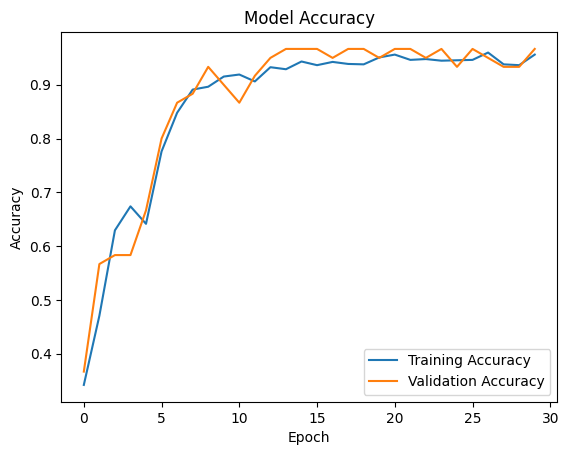

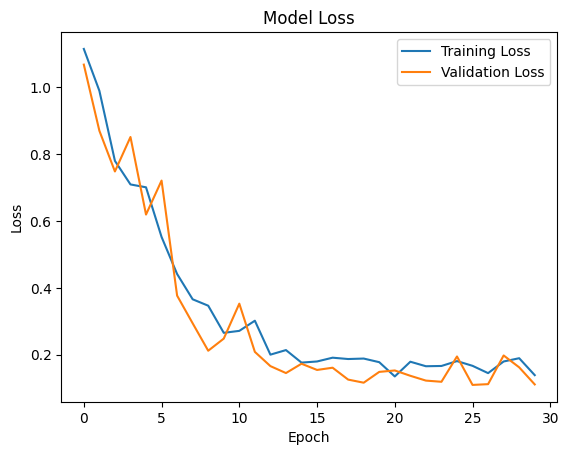

In [14]:
import matplotlib.pyplot as plt

# Plot the training and validation accuracy
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(loc='lower right')
plt.show()

# Plot the training and validation loss
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(loc='upper right')
plt.show()

In [15]:
acc = history.history["accuracy"]
val_acc = history.history["val_accuracy"]

loss = history.history["loss"]
val_loss = history.history["val_loss"]

# Image Predictions on Test Data

In [16]:
def Prediction(model,img):
    img_array = tf.keras.preprocessing.image.img_to_array((images[i].numpy()))
    img_array = tf.expand_dims(img_array,0)

    predictions = model.predict(img_array)

    predicted_class = class_labels[np.argmax(predictions[0])]
    confidence = round(100*(np.max(predictions[0])),2)

    return predicted_class , confidence

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step
1/1 ━━━━━━━

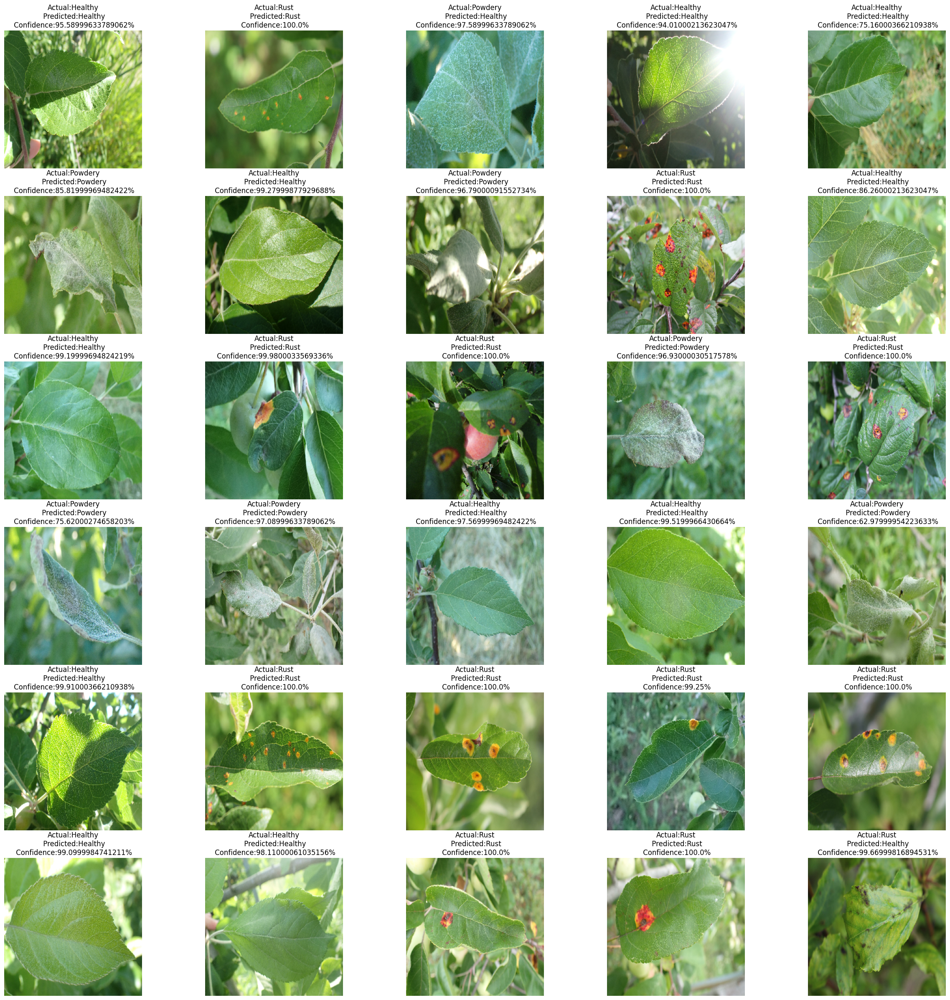

In [17]:
import tensorflow as tf
import matplotlib.pyplot as plt
import numpy as np # Import numpy

def Prediction(model,img):
    img_array = tf.keras.preprocessing.image.img_to_array((images[i].numpy()))
    img_array = tf.expand_dims(img_array,0)     # create a batch

    predictions = model.predict(img_array)

    predicted_class = class_labels[np.argmax(predictions[0])] # Use np here
    confidence = round(100*(np.max(predictions[0])),2) # And here

    return predicted_class , confidence

plt.figure(figsize=(30,30))
for images , labels in test.take(1):
    for i in range(30):
        ax = plt.subplot(6,5,i+1)
        plt.imshow(images[i].numpy().astype("uint8"))
        #plt.title(class_labels[labels[i]])


        predicted_class , confidence = Prediction(model,images[i].numpy())
        actual_class = class_labels[labels[i]]
        plt.title(f"Actual:{actual_class}\n Predicted:{predicted_class}\n Confidence:{confidence}%")
        plt.axis("off")

# Saving Model into SavedModel, TF-Lite and TFJS Format

In [18]:
# SavedModel
model.export("plant_model_savedmodel")

Saved artifact at 'plant_model_savedmodel'. The following endpoints are available:

* Endpoint 'serve'
  args_0 (POSITIONAL_ONLY): TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32, name='keras_tensor_10')
Output Type:
  TensorSpec(shape=(None, 3), dtype=tf.float32, name=None)
Captures:
  133646697738704: TensorSpec(shape=(), dtype=tf.resource, name=None)
  133646639043344: TensorSpec(shape=(), dtype=tf.resource, name=None)
  133646639043920: TensorSpec(shape=(), dtype=tf.resource, name=None)
  133646639042960: TensorSpec(shape=(), dtype=tf.resource, name=None)
  133646639051408: TensorSpec(shape=(), dtype=tf.resource, name=None)
  133646639049296: TensorSpec(shape=(), dtype=tf.resource, name=None)
  133646639050256: TensorSpec(shape=(), dtype=tf.resource, name=None)
  133646639053904: TensorSpec(shape=(), dtype=tf.resource, name=None)
  133646639053328: TensorSpec(shape=(), dtype=tf.resource, name=None)
  133646639052752: TensorSpec(shape=(), dtype=tf.resource, name=None)
  13364

In [39]:
model.save("plant_model.h5")

In [19]:
# TF-Lite
# Convert the model to TensorFlow Lite format
converter = tf.lite.TFLiteConverter.from_saved_model("plant_model_savedmodel")

# Enable TF Select ops for unsupported operations
converter.experimental_select_backends = ['GPU', 'CPU']
converter._experimental_lower_tensor_list_ops = False
converter.target_spec.supported_ops = [tf.lite.OpsSet.TFLITE_BUILTINS, tf.lite.OpsSet.SELECT_TF_OPS]

tflite_model = converter.convert()

# Save the TensorFlow Lite model
with open("plant_model.tflite", "wb") as f:
  f.write(tflite_model)

In [30]:
with open('labels.txt', 'w') as f:
    for label in class_labels:
        f.write(f"{label}\n")

In [41]:
# Tensorflow.js
!tensorflowjs_converter --input_format=keras plant_model.h5 tfjs_model

2025-04-23 10:04:02.883549: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1745402642.923466   66720 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1745402642.935076   66720 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
🌲 Try https://ydf.readthedocs.io, the successor of TensorFlow Decision Forests with more features and faster training!
failed to lookup keras version from the file,
    this is likely a weight only file


In [21]:
!ls -lh plant_model_savedmodel
!ls -lh plant_tfjs_model
!ls -lh plant_model.tflite

total 224K
drwxr-xr-x 2 root root 4.0K Apr 23 08:59 assets
-rw-r--r-- 1 root root   57 Apr 23 08:59 fingerprint.pb
-rw-r--r-- 1 root root 210K Apr 23 08:59 saved_model.pb
drwxr-xr-x 2 root root 4.0K Apr 23 08:59 variables
total 0
-rw-r--r-- 1 root root 26M Apr 23 08:59 plant_model.tflite


In [22]:
pip freeze > requirements.txt

In [24]:
!zip -r plant_model_savedmodel.zip plant_model_savedmodel
files.download('plant_model_savedmodel.zip')

  adding: plant_model_savedmodel/ (stored 0%)
  adding: plant_model_savedmodel/assets/ (stored 0%)
  adding: plant_model_savedmodel/fingerprint.pb (stored 0%)
  adding: plant_model_savedmodel/variables/ (stored 0%)
  adding: plant_model_savedmodel/variables/variables.data-00000-of-00001 (deflated 8%)
  adding: plant_model_savedmodel/variables/variables.index (deflated 67%)
  adding: plant_model_savedmodel/saved_model.pb (deflated 89%)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [42]:
!zip -r tfjs_model.zip tfjs_model
files.download('tfjs_model.zip')

  adding: tfjs_model/ (stored 0%)
  adding: tfjs_model/model.json (deflated 87%)
  adding: tfjs_model/group1-shard5of7.bin (deflated 8%)
  adding: tfjs_model/group1-shard3of7.bin (deflated 8%)
  adding: tfjs_model/group1-shard2of7.bin (deflated 8%)
  adding: tfjs_model/group1-shard4of7.bin (deflated 8%)
  adding: tfjs_model/group1-shard1of7.bin (deflated 8%)
  adding: tfjs_model/group1-shard6of7.bin (deflated 8%)
  adding: tfjs_model/group1-shard7of7.bin (deflated 8%)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>